In [145]:
import pandas as pd
import os
 
# List of file paths
file_paths = [
    "dataset-of-60s.csv",
    "dataset-of-70s.csv",
    "dataset-of-80s.csv",
    "dataset-of-90s.csv",
    "dataset-of-00s.csv",
    "dataset-of-10s.csv"
]
 
# Load and merge datasets
dataframes = [pd.read_csv(file) for file in file_paths]
merged_df = pd.concat(dataframes, ignore_index=True)
 
# Remove duplicates
merged_df.drop_duplicates(inplace=True)
 
# Save cleaned dataset to a new CSV file
merged_df.to_csv("merged_cleaned_dataset.csv", index=False)
 
print("Merged and cleaned dataset saved as 'merged_cleaned_dataset.csv'")

Merged and cleaned dataset saved as 'merged_cleaned_dataset.csv'


In [146]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Define file path
file_path = "merged_cleaned_dataset.csv"  
df = pd.read_csv(file_path)

print("Dataset Info:")
print(df.info())

print("\nFirst 5 Rows:")
print(df.head())



Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40686 entries, 0 to 40685
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             40686 non-null  object 
 1   artist            40686 non-null  object 
 2   uri               40686 non-null  object 
 3   danceability      40686 non-null  float64
 4   energy            40686 non-null  float64
 5   key               40686 non-null  int64  
 6   loudness          40686 non-null  float64
 7   mode              40686 non-null  int64  
 8   speechiness       40686 non-null  float64
 9   acousticness      40686 non-null  float64
 10  instrumentalness  40686 non-null  float64
 11  liveness          40686 non-null  float64
 12  valence           40686 non-null  float64
 13  tempo             40686 non-null  float64
 14  duration_ms       40686 non-null  int64  
 15  time_signature    40686 non-null  int64  
 16  chorus_hit        40686 no

In [147]:
# Check for missing values
print("\nMissing Values:")
print(df.isnull().sum())



Missing Values:
track               0
artist              0
uri                 0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
chorus_hit          0
sections            0
target              0
dtype: int64


In [148]:
# Summary statistics
print("\nSummary Statistics:")
print(df.describe())


Summary Statistics:
       danceability        energy           key      loudness          mode  \
count  40686.000000  40686.000000  40686.000000  40686.000000  40686.000000   
mean       0.539050      0.578733      5.213489    -10.241982      0.692843   
std        0.177935      0.253034      3.533382      5.323189      0.461321   
min        0.000000      0.000251      0.000000    -49.253000      0.000000   
25%        0.419000      0.395000      2.000000    -12.842750      0.000000   
50%        0.551000      0.600000      5.000000     -9.279000      1.000000   
75%        0.669000      0.787000      8.000000     -6.387000      1.000000   
max        0.988000      1.000000     11.000000      3.744000      1.000000   

        speechiness  acousticness  instrumentalness      liveness  \
count  40686.000000  40686.000000      40686.000000  40686.000000   
mean       0.073034      0.365701          0.155767      0.201691   
std        0.086235      0.339518          0.304571      0.1

In [149]:
df.head()

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target
0,Jealous Kind Of Fella,Garland Green,spotify:track:1dtKN6wwlolkM8XZy2y9C1,0.417,0.620,3,-7.727,1,0.0403,0.490,0.000000,0.0779,0.845,185.655,173533,3,32.94975,9,1
1,Initials B.B.,Serge Gainsbourg,spotify:track:5hjsmSnUefdUqzsDogisiX,0.498,0.505,3,-12.475,1,0.0337,0.018,0.107000,0.1760,0.797,101.801,213613,4,48.82510,10,0
2,Melody Twist,Lord Melody,spotify:track:6uk8tI6pwxxdVTNlNOJeJh,0.657,0.649,5,-13.392,1,0.0380,0.846,0.000004,0.1190,0.908,115.940,223960,4,37.22663,12,0
3,Mi Bomba Sonó,Celia Cruz,spotify:track:7aNjMJ05FvUXACPWZ7yJmv,0.590,0.545,7,-12.058,0,0.1040,0.706,0.024600,0.0610,0.967,105.592,157907,4,24.75484,8,0
4,Uravu Solla,P. Susheela,spotify:track:1rQ0clvgkzWr001POOPJWx,0.515,0.765,11,-3.515,0,0.1240,0.857,0.000872,0.2130,0.906,114.617,245600,4,21.79874,14,0


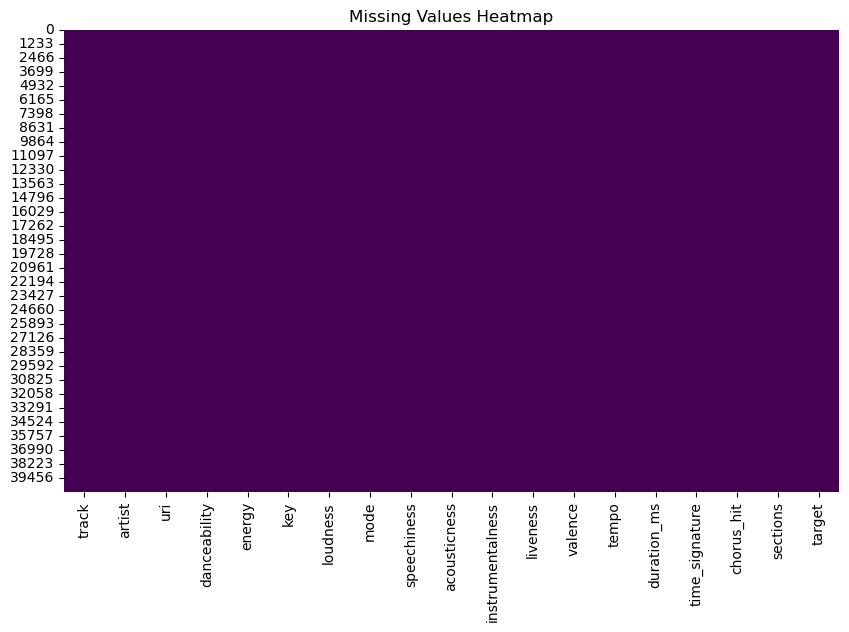

In [150]:
# Visualizing missing values
plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap")
plt.show()

In [151]:
# Checking duplicate rows
duplicate_count = df.duplicated().sum()
print(f"\nNumber of Duplicate Rows: {duplicate_count}")


Number of Duplicate Rows: 0


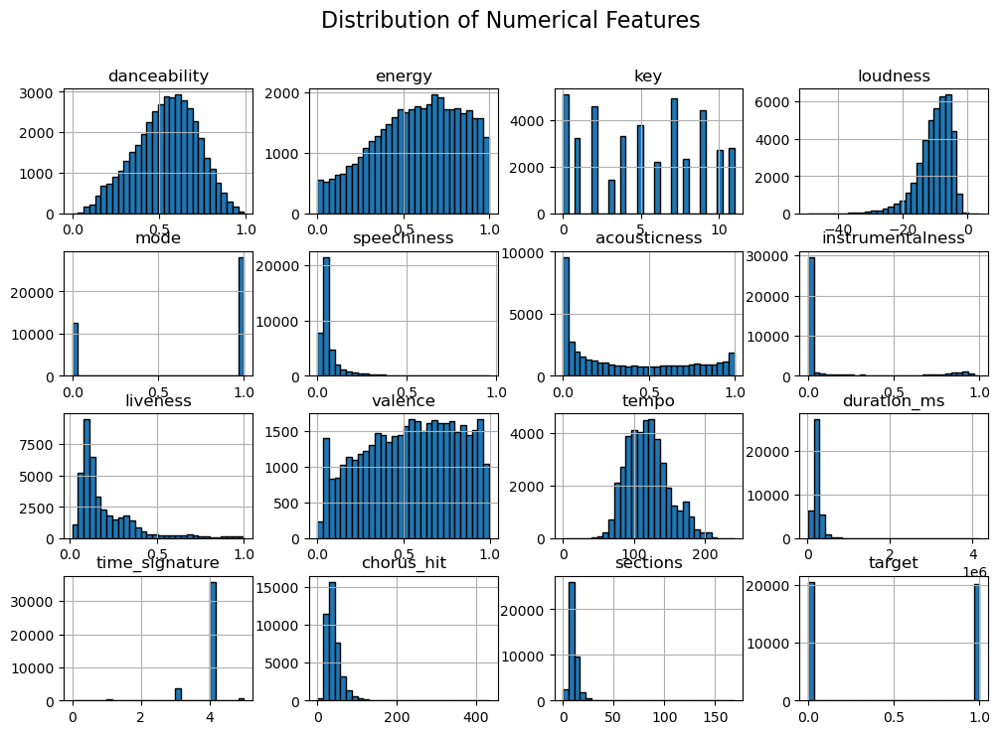

In [152]:
# Data distribution of numerical features
df.hist(figsize=(12, 8), bins=30, edgecolor='black')
plt.suptitle("Distribution of Numerical Features", fontsize=16)
plt.show()

(a) The mean, median, and standard deviation

In [154]:
# Identify numeric and non-numeric columns
numeric_columns = df.select_dtypes(include=['number']).columns
non_numeric_columns = df.select_dtypes(exclude=['number']).columns

print("\nNumeric Columns:", list(numeric_columns))
print("Non-Numeric Columns:", list(non_numeric_columns))

# Compute mean, median, and standard deviation
stats_summary = df[numeric_columns].agg(['mean', 'median', 'std'])
print("\nStatistical Summary:")
print(stats_summary)


Numeric Columns: ['danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'time_signature', 'chorus_hit', 'sections', 'target']
Non-Numeric Columns: ['track', 'artist', 'uri']

Statistical Summary:
        danceability    energy       key   loudness      mode  speechiness  \
mean        0.539050  0.578733  5.213489 -10.241982  0.692843     0.073034   
median      0.551000  0.600000  5.000000  -9.279000  1.000000     0.043500   
std         0.177935  0.253034  3.533382   5.323189  0.461321     0.086235   

        acousticness  instrumentalness  liveness   valence       tempo  \
mean        0.365701          0.155767  0.201691  0.541789  119.320858   
median      0.261000          0.000125  0.132000  0.558000  117.528000   
std         0.339518          0.304571  0.173146  0.267517   29.110536   

          duration_ms  time_signature  chorus_hit   sections    target  
mean    234738.347835  

(b) Draw boxplots of attributes in one frame.

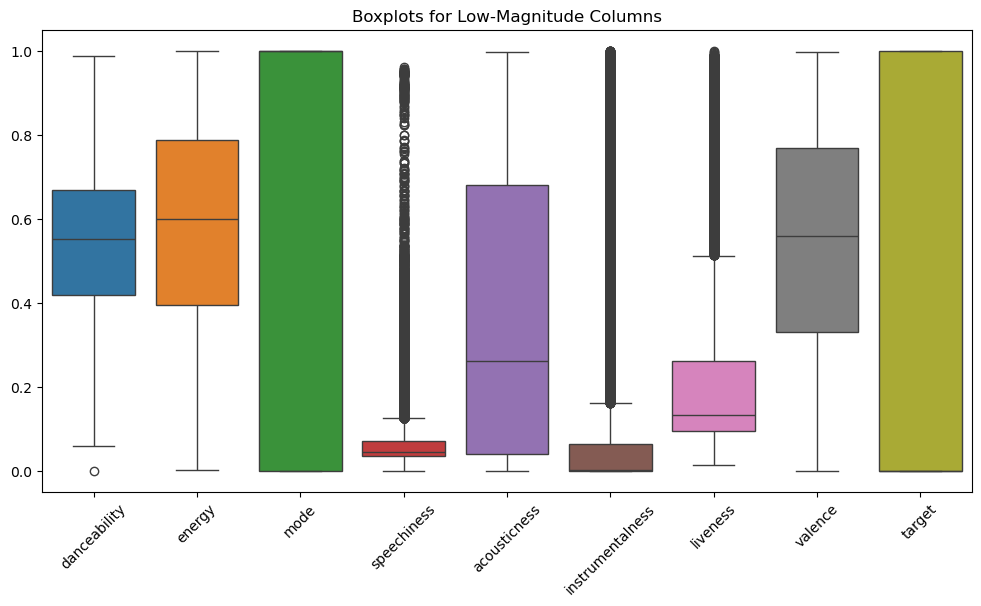

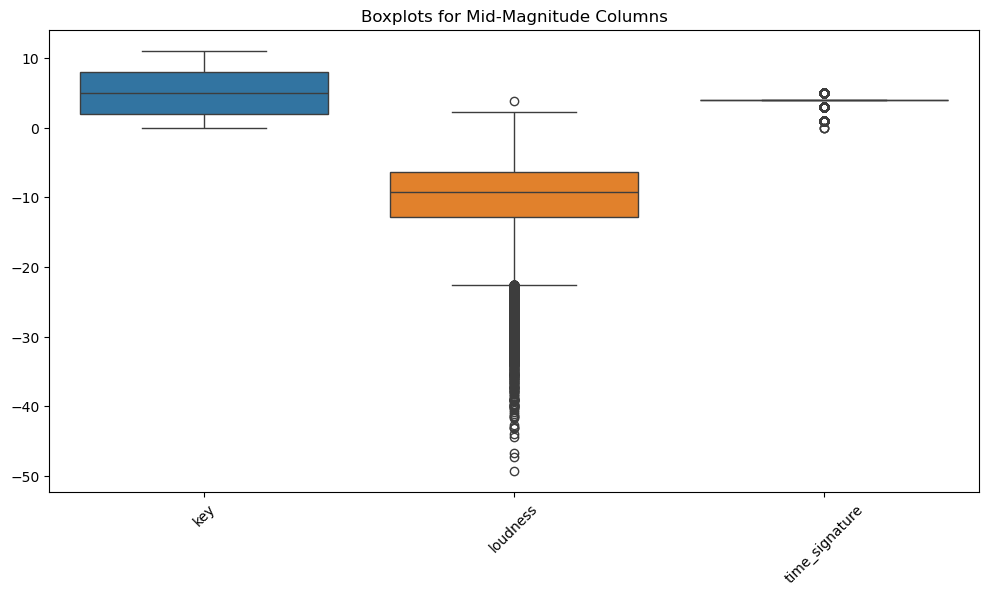

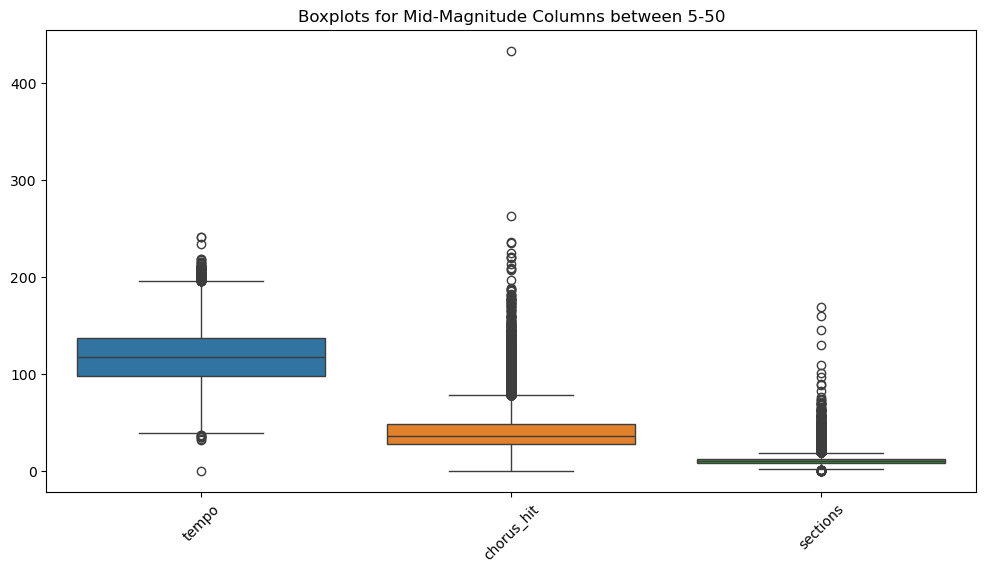

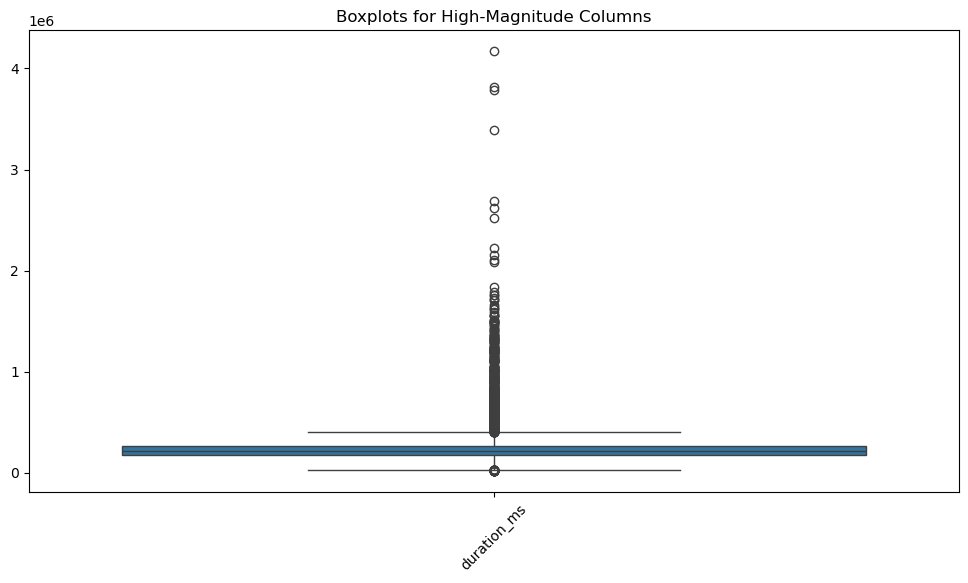

In [156]:
# Calculate absolute max value for each column to categorize based on magnitude
col_magnitudes = df[numeric_columns].apply(lambda x: max(abs(x.min()), abs(x.max())))

# Define magnitude thresholds for grouping
low_range = col_magnitudes[col_magnitudes < 5].index.tolist()
mid_range = col_magnitudes[(col_magnitudes >= 5) & (col_magnitudes < 50)].index.tolist()
mid_range_2 = col_magnitudes[(col_magnitudes >= 50) & (col_magnitudes < 1000)].index.tolist()
high_range = col_magnitudes[col_magnitudes >= 1000].index.tolist()

# Function to plot grouped boxplots
def plot_boxplot(column_list, title):
    if column_list:
        plt.figure(figsize=(12, 6))
        sns.boxplot(data=df[column_list])
        plt.xticks(rotation=45)
        plt.title(title)
        plt.show()

# Plot separate boxplots for each group
plot_boxplot(low_range, "Boxplots for Low-Magnitude Columns")
plot_boxplot(mid_range, "Boxplots for Mid-Magnitude Columns")
plot_boxplot(mid_range_2, "Boxplots for Mid-Magnitude Columns between 5-50")
plot_boxplot(high_range, "Boxplots for High-Magnitude Columns")

(c) Draw pairplots.

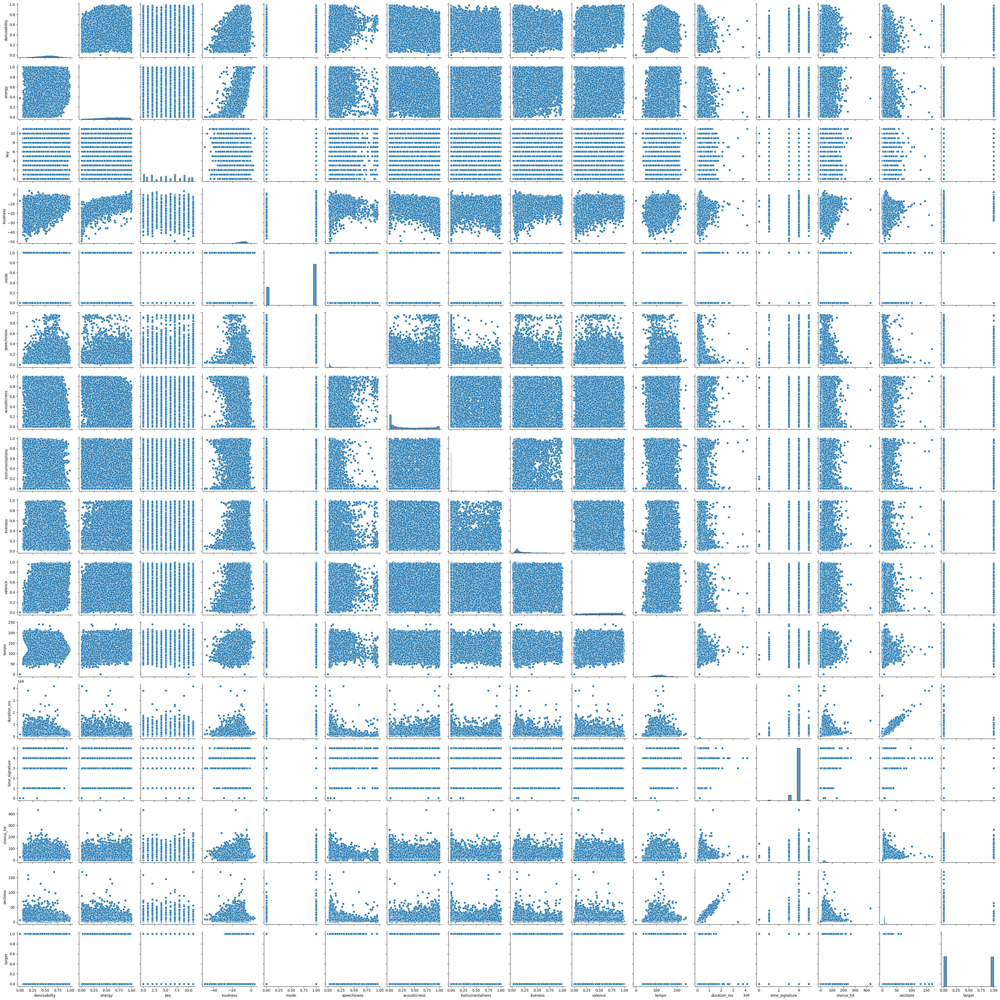

In [158]:
# Pairplot of the dataset
sns.pairplot(df[numeric_columns])
plt.show()

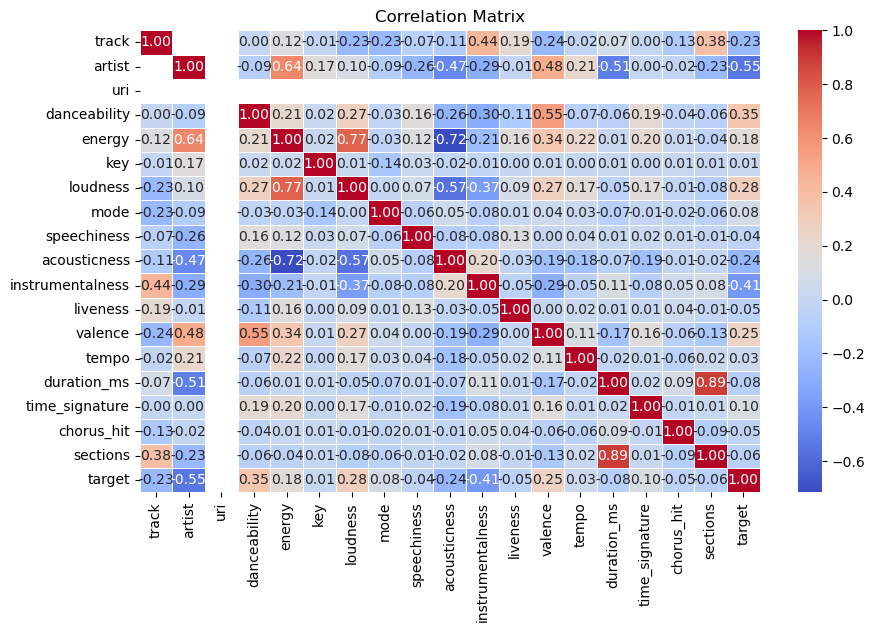

In [159]:
# Handle mixed data types (convert possible numeric columns)
for col in non_numeric_columns:
    try:
        df[col] = pd.to_numeric(df[col], errors='coerce')  # Converts invalid values to NaN
    except Exception:
        print(f"Skipping non-convertible column: {col}")

# Drop non-numeric columns from numerical analysis
df_numeric = df[numeric_columns]
            
# Correlation matrix
plt.figure(figsize=(10, 6))
sns.heatmap(df.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Correlation Matrix")
plt.show()

# Value counts for categorical features
categorical_columns = df.select_dtypes(include=['object']).columns
for col in categorical_columns:
    print(f"\nValue Counts for {col}:")
    print(df[col].value_counts())

(d) Calculate the correlation if the scatter plot shows a correlation among variables. We can use the following command for this purpose.

In [161]:
from scipy.stats import pearsonr
# Calculate Pearson's correlation for each numerical column with the target variable
if 'danceability' in df.columns:
    correlations = {}
    for col in numeric_columns:
        if col != 'danceability':
            corr, _ = pearsonr(df[col], df['danceability'])
            correlations[col] = corr
    
    # Convert to DataFrame and display
    corr_df = pd.DataFrame.from_dict(correlations, orient='index', columns=['Pearson Correlation'])
    print("\nPearson Correlations with Target:")
    print(corr_df)


Pearson Correlations with Target:
                  Pearson Correlation
energy                       0.205252
key                          0.015464
loudness                     0.274328
mode                        -0.031720
speechiness                  0.157083
acousticness                -0.260056
instrumentalness            -0.302353
liveness                    -0.114316
valence                      0.553816
tempo                       -0.065088
duration_ms                 -0.064032
time_signature               0.191306
chorus_hit                  -0.035720
sections                    -0.059830
target                       0.345802


Features to Keep 🟢
energy (0.205)
loudness (0.274)
acousticness (-0.260)
instrumentalness (-0.302)
valence (0.554)
speechiness (0.157)
Features to Drop 🛑
key, mode, liveness, tempo, duration_ms, time_signature, chorus_hit, sections

In [163]:
# List of columns to drop based on correlation analysis
cols_to_drop = [
    'key', 'mode', 'liveness', 'tempo', 
    'duration_ms', 'time_signature', 'chorus_hit', 'sections'
]

# Drop these columns from the dataframe
df = df.drop(columns=cols_to_drop)

print("Dropped columns:", cols_to_drop)
print("Remaining columns:", df.columns)


Dropped columns: ['key', 'mode', 'liveness', 'tempo', 'duration_ms', 'time_signature', 'chorus_hit', 'sections']
Remaining columns: Index(['track', 'artist', 'uri', 'danceability', 'energy', 'loudness',
       'speechiness', 'acousticness', 'instrumentalness', 'valence', 'target'],
      dtype='object')


(e) Reflect on your key learnings and difficulties while completing this assignment, encapsulating your thoughts in approximately 100 words within a text cell.

### Reflection on Key Learnings and Difficulties

#### **Key Learnings:**
- Gained hands-on experience with **exploratory data analysis (EDA)** techniques.
- Learned to **clean data**, replacing missing or inappropriate values using mean or median.
- Used **descriptive statistics** (mean, median, standard deviation) to understand data distribution.
- Created **boxplots and pairplots** to visualize feature relationships and detect outliers.
- Applied **Pearson’s correlation** to measure relationships between variables.
- Improved skills in **data visualization and interpretation** for meaningful insights.

#### **Challenges Faced:**
- **Handling missing values**: Deciding between mean and median for replacement was context-dependent.
- **Data inconsistency**: Some features required more preprocessing before analysis.
- **Visualization adjustments**: Ensuring that graphs were clear and easy to interpret.
- **Computational challenges**: Working with a large dataset required efficient processing.


# Project Part 3 : Regression 

In [167]:
df.head()

,track,artist,uri,danceability,energy,loudness,speechiness,acousticness,instrumentalness,valence,target
0,NaN,NaN,NaN,0.417,0.620,-7.727,0.0403,0.490,0.000000,0.845,1
1,NaN,NaN,NaN,0.498,0.505,-12.475,0.0337,0.018,0.107000,0.797,0
2,NaN,NaN,NaN,0.657,0.649,-13.392,0.0380,0.846,0.000004,0.908,0
3,NaN,NaN,NaN,0.590,0.545,-12.058,0.1040,0.706,0.024600,0.967,0
4,NaN,NaN,NaN,0.515,0.765,-3.515,0.1240,0.857,0.000872,0.906,0


In [168]:
from sklearn.preprocessing import StandardScaler
# Standardize "loudness" 
scaler = StandardScaler()
df["loudness"] = scaler.fit_transform(df[["loudness"]])

Used Standard Scaler to normalize the loudness.

In [170]:
# Define the input features and target variable
selected_features = ["energy", "loudness", "speechiness", "acousticness", "instrumentalness", "valence"]
X = df[selected_features]
y = df["danceability"]

In [171]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score

# Split the dataset into training (70%) and testing (30%) sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

**Using The RandomForest Regressor model outperforms the Linear Regression model.**

In [173]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor(n_estimators=150, random_state=42)
rf_model.fit(X_train, y_train)

RandomForestRegressor(n_estimators=150, random_state=42)

In [174]:
# Predict and compute R² score
y_rf_pred = rf_model.predict(X_test)
r2_rf = r2_score(y_test, y_rf_pred)
print(f"Random Forest R² Score: {r2_rf:.3f}")

Random Forest R² Score: 0.481


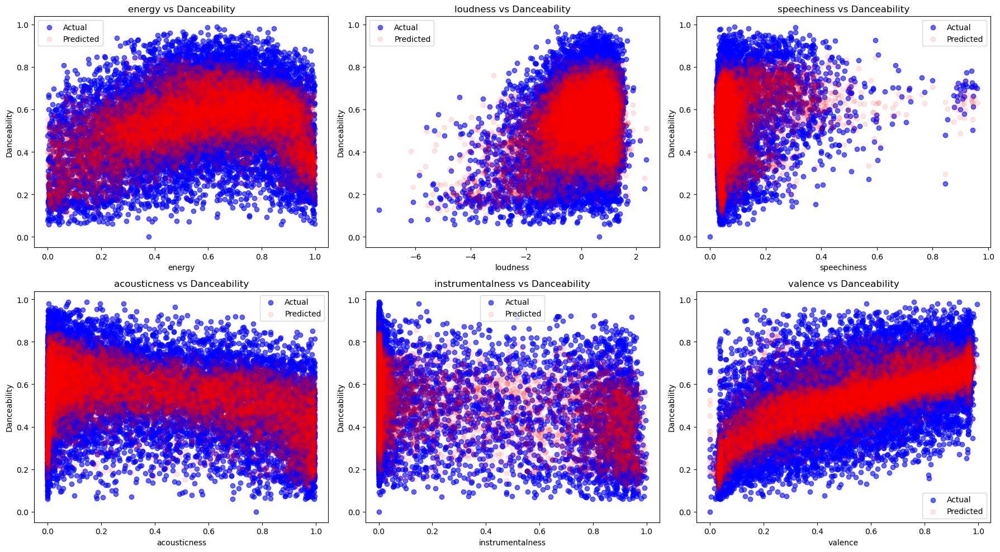

In [175]:
# Scatter plots for actual vs predicted values
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, feature in enumerate(selected_features):
    axes[i].scatter(X_test[feature], y_test, color="blue", alpha=0.6, label="Actual")
    axes[i].scatter(X_test[feature], y_rf_pred, color="red", alpha=0.1, label="Predicted")
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Danceability")
    axes[i].set_title(f"{feature} vs Danceability")
    axes[i].legend()

plt.tight_layout()
plt.show()

### Feature-wise Analysis Actual vs Predicted
1. **Energy vs. Danceability**
Conclusion: The predicted values (red) follow the distribution but seem more concentrated. The model struggles to finds a strong trend between energy and danceability.

2. **Loudness vs. Danceability**
The actual values show that as loudness increases, danceability varies significantly has some predictive power but isn't a perfect indicator of danceability.

3. **Speechiness vs. Danceability**
The actual values (blue) show that low speechiness corresponds to a wide range of danceability. The predicted values show a similar spread, but they are more concentrated.

4. **Acousticness vs. Danceability**
There is a visible negative trend: Higher acousticness generally leads to lower danceability. The predicted values (red) capture this trend reasonably well.

5. **Instrumentalness vs. Danceability**
A chaotic spread with no clear pattern in actual or predicted values. The model seems to be randomly predicting values. Instrumentalness does not significantly contribute to predicting danceability.

6. **Valence vs. Danceability**
A strong positive correlation is visible: higher valence means higher danceability. Valence is one of the strongest predictors of danceability.

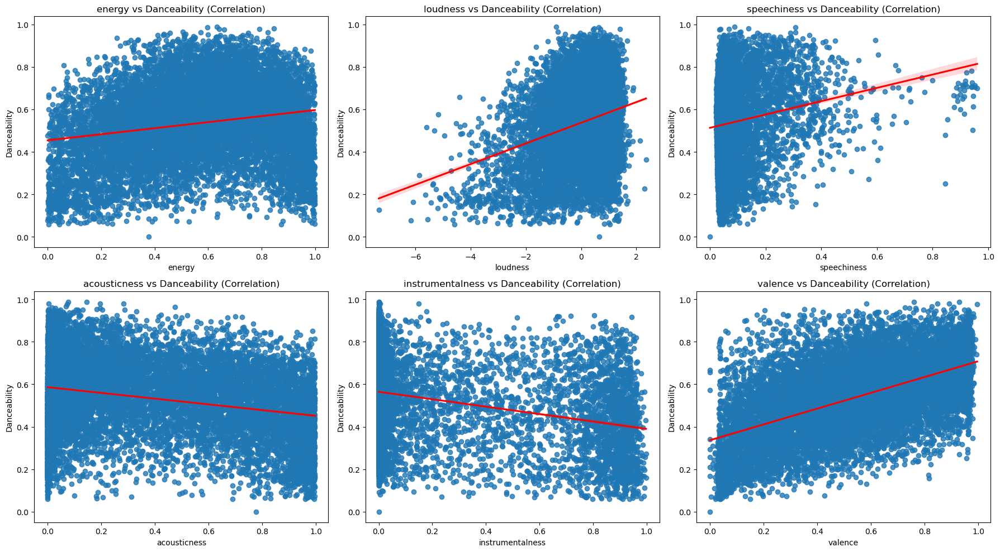

In [177]:
# Scatter plots: Feature vs. Target variable (correlation check)
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
axes = axes.flatten()

for i, feature in enumerate(selected_features):
    sns.regplot(x=X_test[feature], y=y_test, scatter=True, line_kws={"color": "red"}, ax=axes[i])
    axes[i].set_xlabel(feature)
    axes[i].set_ylabel("Danceability")
    axes[i].set_title(f"{feature} vs Danceability (Correlation)")

plt.tight_layout()
plt.show()

# Conclusion 
1. Correlation analysis correctly identified valence and acousticness as key features.
2. Some moderately correlated features (e.g., Loudness, Instrumentalness) were weaker predictors than expected.
3. Energy and Speechiness did not contribute significantly, confirming their weak correlation.

Correlation alone is not enough to determine predictive power; regression modeling validates actual feature importance.

Summary of Learnings and Challenges

**Key Learnings**

1. Correlation Analysis Helped Identify Key Features and the Model Validation Confirmed Weak Features.
2. Features with low correlation (Energy, Speechiness, Tempo) performed poorly in the model, confirming correlation analysis. Random Forest Performed Better Than Linear Regression.
3. The model captured non-linear relationships better than linear regression. Scatter plots confirmed that some features had non-linear trends.
4. Hyperparameter Tuning: Adjusting parameters like n_estimators enhanced model accuracy.

**Challenges Faced**

1. Some Moderately Correlated Features Didn’t Perform Well Instrumentalness (-0.30) and Loudness (0.27) were expected to be strong predictors but showed variance in predictions. R² Score Was Moderate = **0.481**(Not Close to 1).
2. The model could not fully explain danceability variance.
3. Random Forest’s complexity made it difficult to interpret individual predictions.



# Project Part 4 - Clustering and classification

In [181]:
from sklearn.cluster import KMeans, MiniBatchKMeans, MeanShift, AgglomerativeClustering
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

Clustering_features = ["energy", "loudness", "danceability"]
XC = df[Clustering_features]

# Standardize features
scaler = StandardScaler()
XC_scaled = scaler.fit_transform(XC)


## Applying K-means and visualizing it 

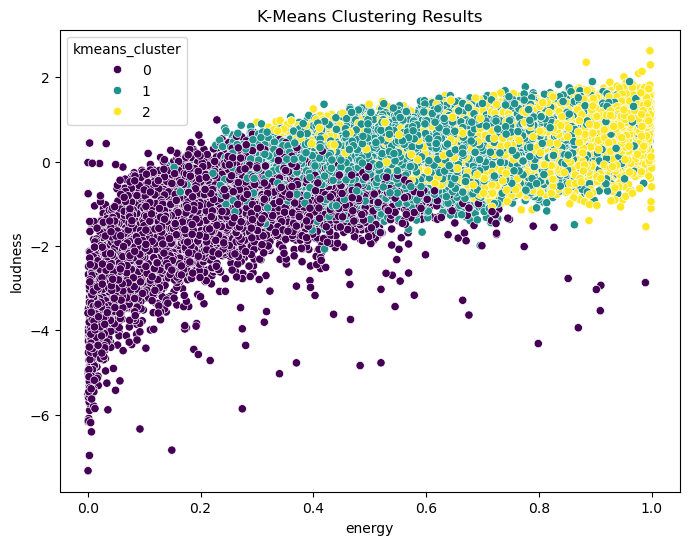

In [183]:
# Apply K-Means Clustering
kmeans = KMeans(n_clusters=3, random_state=42)
df["kmeans_cluster"] = kmeans.fit_predict(XC_scaled)

# Visualizing Clusters for K-Means
plt.figure(figsize=(8, 6))
sns.scatterplot(x=XC.iloc[:, 0], y=XC.iloc[:, 1], hue=df["kmeans_cluster"], palette="viridis")
plt.title("K-Means Clustering Results")
plt.show()


### K-Means Clustering
The **K-Means clustering algorithm** successfully grouped the dataset into three clusters. The clusters are well-separated along the **energy-loudness** space, showing a natural division of the data. The visualization shows that it managed to find meaningful groupings in the dataset.


# Applying Mini-Batch K-means and visualizing.

C:\Anaconda\Lib\site-packages\sklearn\cluster\_kmeans.py:1972: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 4096 or by setting the environment variable OMP_NUM_THREADS=4
  warnings.warn(


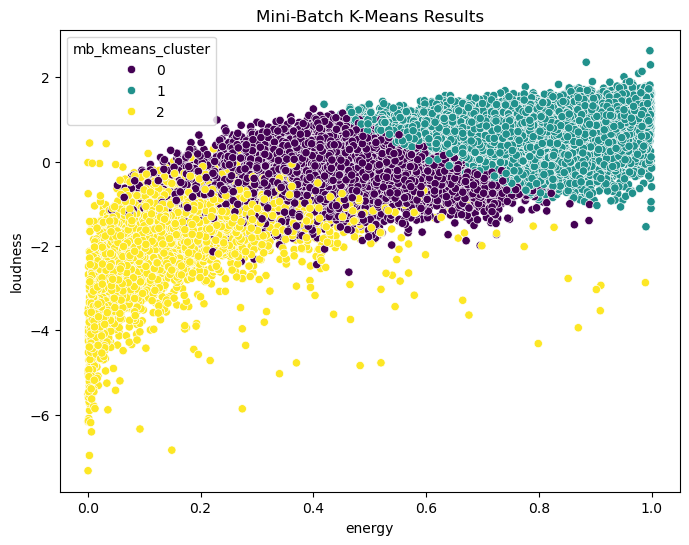

In [186]:
# Apply Mini-Batch K-Means
mb_kmeans = MiniBatchKMeans(n_clusters=3, random_state=42)
df["mb_kmeans_cluster"] = mb_kmeans.fit_predict(XC_scaled)

# Visualizing Clusters for Mini-Batch K-Means
plt.figure(figsize=(8, 6))
sns.scatterplot(x=XC.iloc[:, 0], y=XC.iloc[:, 1], hue=df["mb_kmeans_cluster"], palette="viridis")
plt.title("Mini-Batch K-Means Results")
plt.show()



### Mini-Batch K-Means Clustering
Mini-Batch K-Means, provides similar results but with some variations in cluster assignment. The clustering boundaries appear slightly noisier, possibly due to the approximation. However, it still identifies divisions in the dataset.

# Applying Mean-Shift Clustering and visualizing.

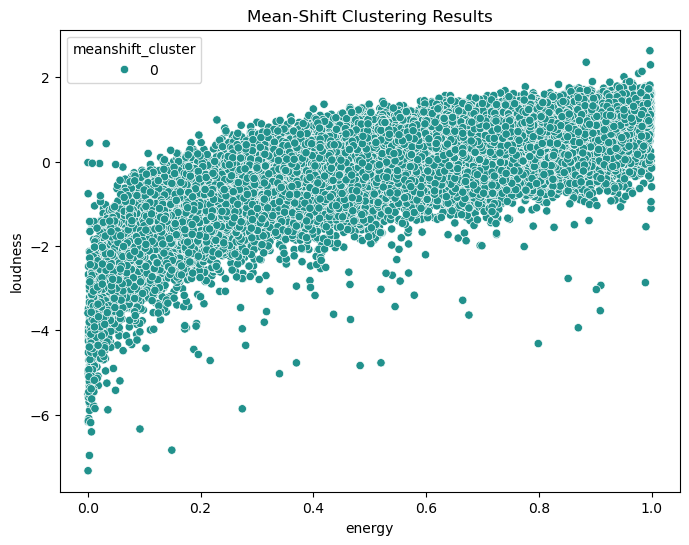

In [189]:
# Apply Mean-Shift Clustering
mean_shift = MeanShift()
df["meanshift_cluster"] = mean_shift.fit_predict(XC_scaled)

# Visualizing Clusters for Mean-Shift Clustering
plt.figure(figsize=(8, 6))
sns.scatterplot(x=XC.iloc[:, 0], y=XC.iloc[:, 1], hue=df["meanshift_cluster"], palette="viridis")
plt.title("Mean-Shift Clustering Results")
plt.show()


### Mean-Shift Clustering
Mean-Shift clustering resulted in only **one cluster**, indicating that the algorithm didn't detect multiple distinct density regions in the dataset. suggests that the dataset does not have strong density variations, making Mean-Shift unsuitable.

# Applying Agglomerative and visualizing.

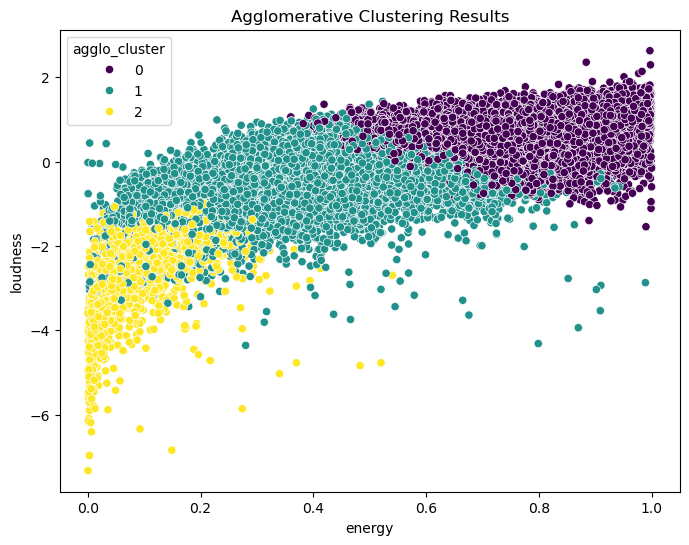

In [192]:
# Apply Agglomerative Clustering
agglo = AgglomerativeClustering(n_clusters=3)
df["agglo_cluster"] = agglo.fit_predict(XC_scaled)

# Visualizing Clusters for Agglomerative Clustering
plt.figure(figsize=(8, 6))
sns.scatterplot(x=XC.iloc[:, 0], y=XC.iloc[:, 1], hue=df["agglo_cluster"], palette="viridis")
plt.title("Agglomerative Clustering Results")
plt.show()

### Agglomerative Clustering
Agglomerative clustering, successfully identified three clusters. The results are comparable to K-Means but differ slightly in boundaries but predicts the cluster properly and are well differentiated.


## Conclusion for all the Clustering meathods applied

Among the clustering methods applied, **Agglomerative clustering** provided the most well-defined and meaningful clusters. The visualization shows distinct groupings with smooth transitions, indicating that the **energy, loudness, and danceability** features naturally form relationships.

**Mini-Batch K-Means** followed closely, offering a better cluster quality, though some boundary noise was visible. 

**K-Means**, while effective, had slightly weaker separation compared to Agglomerative clustering.

**Mean-Shift clustering failed**, detecting only one cluster, suggesting the dataset lacks density variations. 

Based on visual clarity, compactness, and effectiveness, **Agglomerative clustering is the best method**, followed by Mini-Batch K-Means.


# Applying Classification Methods

In [196]:
# Convert instrumentalness into discrete categories Since it is continous form we will create bins ("Low", "Medium", "High") and then classify it.

# Define bin edges based on percentiles
bins = [-0.01, 0.01, 0.3, 1.0]  
labels = ["Low", "Medium", "High"]  

# Apply binning
df["instrumentalness_category"] = pd.cut(df["instrumentalness"], bins=bins, labels=labels)

# Define the input features and target variable
Class_features = ["energy", "speechiness", "acousticness","danceability"]
Class_X = df[Class_features]
Class_y = df["instrumentalness_category"]

# Train test split. 
CX_train, CX_test, Cy_train, Cy_test = train_test_split(Class_X, Class_y, test_size=0.3, random_state=42)

# Logistic Regression

Logistic Regression Accuracy: 0.7078


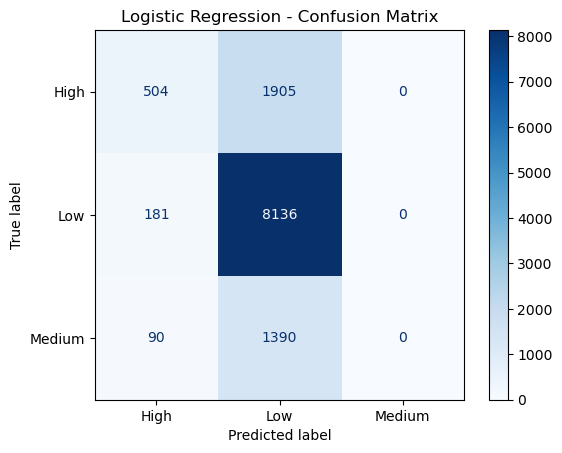

In [198]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Train Logistic Regression
log_reg = LogisticRegression()
log_reg.fit(CX_train, Cy_train)
Cy_pred_log = log_reg.predict(CX_test)

# Evaluate Model
accuracy_log = accuracy_score(Cy_test, Cy_pred_log)
print(f"Logistic Regression Accuracy: {accuracy_log:.4f}")

# Confusion Matrix
cm = confusion_matrix(Cy_test, Cy_pred_log)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=log_reg.classes_)
disp.plot(cmap="Blues")
plt.title("Logistic Regression - Confusion Matrix")
plt.show()


### **Logistic Regression**
Logistic Regression achieved an accuracy of **70.78%**, showing decent performance. However, the model heavily favors the **Low** category, misclassifying most **High** and **Medium** values. The confusion matrix shows that the **Medium** category was never correctly predicted.

# Decision Tree

Decision Tree Accuracy: 0.5942


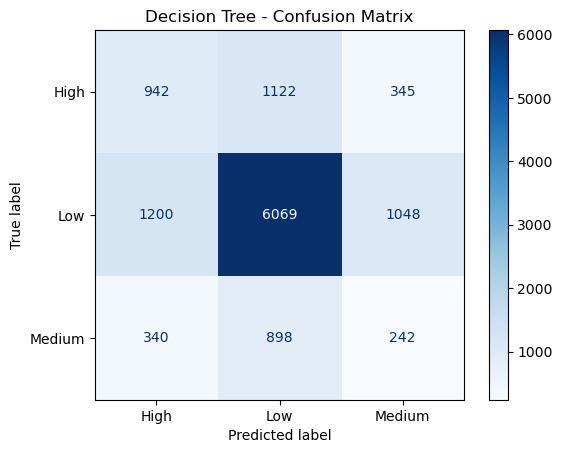

In [201]:
from sklearn.tree import DecisionTreeClassifier

# Train Decision Tree
dt = DecisionTreeClassifier()
dt.fit(CX_train, Cy_train)
Cy_pred_dt = dt.predict(CX_test)

# Evaluate Model
accuracy_dt = accuracy_score(Cy_test, Cy_pred_dt)
print(f"Decision Tree Accuracy: {accuracy_dt:.4f}")

# Confusion Matrix
cm = confusion_matrix(Cy_test, Cy_pred_dt)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=dt.classes_)
disp.plot(cmap="Blues")
plt.title("Decision Tree - Confusion Matrix")
plt.show()


### **Decision Tree**
The Decision Tree classifier had the **low accuracy at 59.42%**, indicating significant misclassification. Unlike Logistic Regression, it makes more balanced predictions across categories, making it an unreliable choice for this classification task.


# SVM (Support Vector Machine)

Support Vector Machine Accuracy: 0.7195


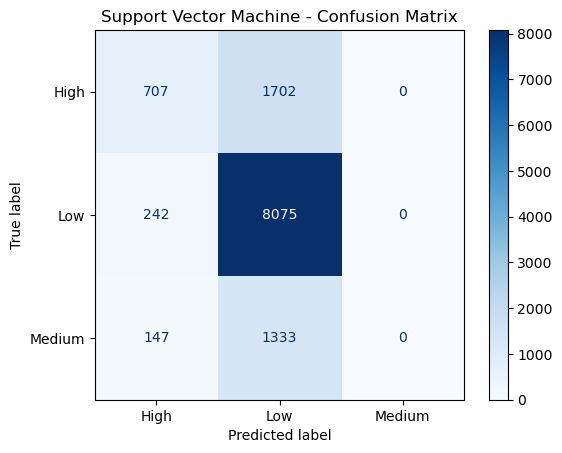

In [204]:
from sklearn.svm import SVC

# Train SVM
svm = SVC()
svm.fit(CX_train, Cy_train)
Cy_pred_svm = svm.predict(CX_test)

# Evaluate Model
accuracy_svm = accuracy_score(Cy_test, Cy_pred_svm)
print(f"Support Vector Machine Accuracy: {accuracy_svm:.4f}")

# Confusion Matrix
cm = confusion_matrix(Cy_test, Cy_pred_svm)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=svm.classes_)
disp.plot(cmap="Blues")
plt.title("Support Vector Machine - Confusion Matrix")
plt.show()


### **Support Vector Machine (SVM)**
SVM performed **better than both Logistic Regression and Decision Tree**, achieving **71.95% accuracy** but like the other models, it **misclassified most Medium values as Low**. Despite its **better accuracy**, the failure to classify the Medium category correctly limits its usefulness.


# Neural Network (MLP Classifier)

Neural Network Accuracy: 0.7230


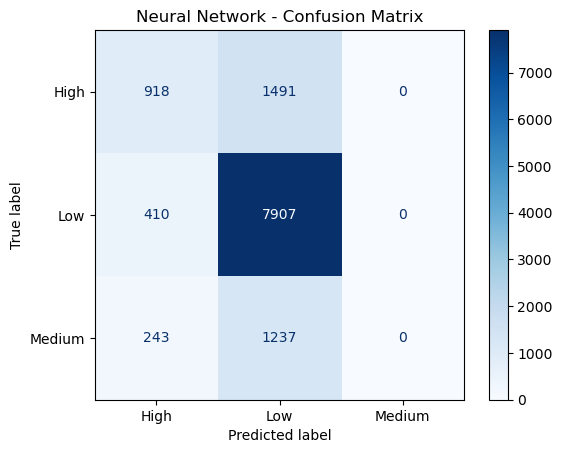

In [207]:
from sklearn.neural_network import MLPClassifier

# Train Neural Network
mlp = MLPClassifier(max_iter=500)
mlp.fit(CX_train, Cy_train)
Cy_pred_mlp = mlp.predict(CX_test)

# Evaluate Model
accuracy_mlp = accuracy_score(Cy_test, Cy_pred_mlp)
print(f"Neural Network Accuracy: {accuracy_mlp:.4f}")

# Confusion Matrix
cm = confusion_matrix(Cy_test, Cy_pred_mlp)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=mlp.classes_)
disp.plot(cmap="Blues")
plt.title("Neural Network - Confusion Matrix")
plt.show()


### **Neural Network (MLP Classifier)**
The Neural Network **outperformed all other models** with an accuracy of **72.30%**, making it the best-performing classifier.However, similar to SVM, it **never correctly predicted Medium values**.

## ROC Curve 

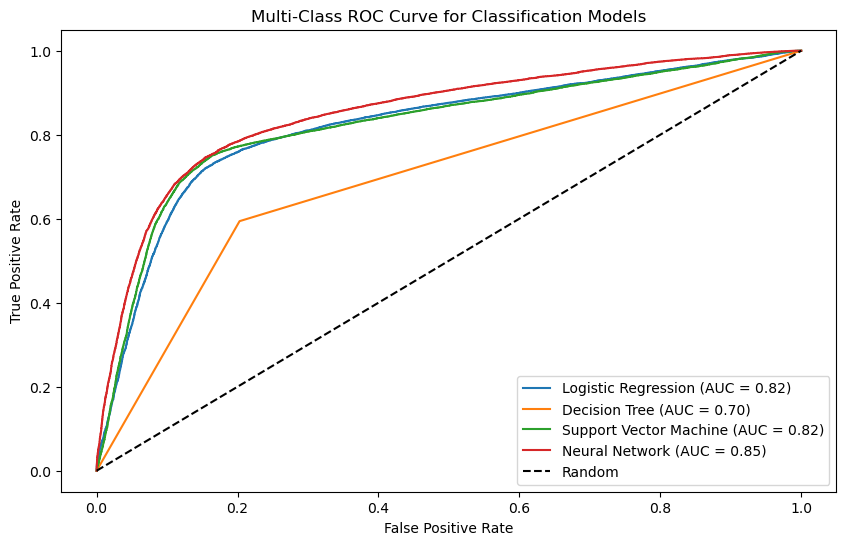

In [271]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Binarize the target variable for multi-class ROC analysis
Cy_test_bin = label_binarize(Cy_test, classes=np.unique(Cy_test))
n_classes = Cy_test_bin.shape[1]

# Define models (using NLP instead of MLP)
models = {
    "Logistic Regression": log_reg,
    "Decision Tree": dt,
    "Support Vector Machine": svm,
    "Neural Network": mlp 
}

# Initialize ROC plot
plt.figure(figsize=(10, 6))

# Compute ROC curve for each model
for model_name, model in models.items():
    # Get probability scores
    if hasattr(model, "predict_proba"):
        y_score = model.predict_proba(CX_test)  # Works for Logistic Regression, Decision Tree, and NLP
    else:
        y_score = model.decision_function(CX_test)  # Works for SVM
    
    # Compute ROC curve and AUC 
    fpr, tpr, _ = roc_curve(Cy_test_bin.ravel(), y_score.ravel())
    roc_auc = auc(fpr, tpr)

    # Plot ROC Curve
    plt.plot(fpr, tpr, label=f"{model_name} (AUC = {roc_auc:.2f})")

# Plot diagonal reference line
plt.plot([0, 1], [0, 1], "k--", label="Random")

# Customize plot
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Multi-Class ROC Curve for Classification Models")
plt.legend(loc="lower right")
plt.show()


### **ROC Curve Analysis**
. The **AUC (Area Under the Curve)** values indicate how well each model distinguishes between classes.

- **Neural Network (AUC = 0.85)** performed the best, showing the highest ability to separate classes.
- **Logistic Regression (AUC = 0.82) and SVM (AUC = 0.82)** performed similarly, demonstrating strong predictive power.
- **Decision Tree (AUC = 0.70)** had the weakest performance, indicating it struggles with generalizatlasses. The **dashed diagonal line represents a random classifier (AUC = 0.50)**, confirming that all models perform significantly better than random gession.**


# Accuracy Comparison Graph

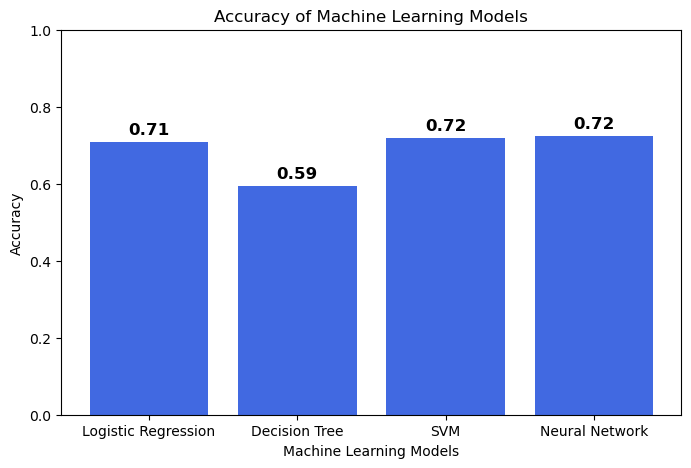

In [277]:
# Define model names and their respective accuracies
models = ["Logistic Regression", "Decision Tree", "SVM", "Neural Network"]
accuracies = [0.7078, 0.5942, 0.7195, 0.7230] 

# Create the bar chart
plt.figure(figsize=(8, 5))
plt.bar(models, accuracies, color='royalblue')

# Label axes and title
plt.xlabel("Machine Learning Models")
plt.ylabel("Accuracy")
plt.title("Accuracy of Machine Learning Models")
plt.ylim(0, 1)  # Ensures the y-axis goes from 0 to 1 for better readability

# Display values on top of bars
for i, v in enumerate(accuracies):
    plt.text(i, v + 0.02, f"{v:.2f}", ha='center', fontsize=12, fontweight='bold')

# Show the plot
plt.show()


# Using ReLU in hidden layers and Softmax in the output layer for better performance.

Neural Network Accuracy: 0.7259


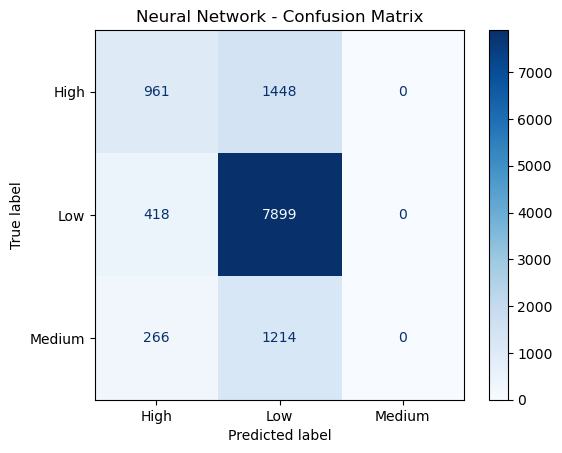

In [283]:
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Define Neural Network with ReLU in hidden layers and Softmax in the output
mlp = MLPClassifier(hidden_layer_sizes=(100, 50),  # Two hidden layers with 100 and 50 neurons
                    activation='relu',  # ReLU activation for hidden layers
                    solver='adam',  # Adam optimizer
                    max_iter=500,  # Increase iterations if necessary
                    random_state=42)

# Train the model
mlp.fit(CX_train, Cy_train)

# Predictions
Cy_pred_mlp = mlp.predict(CX_test)

# Evaluate Model
accuracy_mlp = accuracy_score(Cy_test, Cy_pred_mlp)
print(f"Neural Network Accuracy: {accuracy_mlp:.4f}")

# Confusion Matrix
cm = confusion_matrix(Cy_test, Cy_pred_mlp)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=mlp.classes_)
disp.plot(cmap="Blues")
plt.title("Neural Network - Confusion Matrix")
plt.show()


After using ReLU in hidden layers and Softmax in the output layer we still dont see any significant improvement in our models accuracy.

## **Conclusion: Best Model & Insights**
Among the tested classifiers, **the Neural Network (MLP Classifier) provided the best performance**, achieving **72.3% accuracy**, closely followed by **SVM at 71.95%** and **Logistic Regression at 70.78%**. 

The Decision Tree model performed worse, struggling to distinguish between Medium and other categories. 

Across all models, **the Medium category was never correctly predicted**, suggesting **a class imbalance issue**. Future improvements could include **rebalancing the dataset** (e.g., oversampling the Medium class) and feature engineering to enhance classification. 

using **ReLU** in hidden layers and **Softmax** in the output layer also did not result in any significant improvement in the models Performance.

**Final Verdict :** The **Neural Network is the best-performing model** across all categories.

### **Reflection: Key Learnings and Challenges**

#### **Key Learnings:**
- Data preprocessing, including handling missing values and selecting the right features, is crucial for building effective models.
- Different clustering methods produce varying results, and choosing the best one depends on the dataset's structure.
- Classification models are heavily influenced by data distribution, and **imbalanced classes can lead to biased predictions**.
- **Accuracy alone isn't enough**—it's important to analyze confusion matrices and other evaluation metrics to understand model performance.
- Neural Networks and Support Vector Machines tend to perform well on compl dataset.

#### **Challenges Faced:**
- Managing missing values and ensuring proper data binning for classification.
- Dealing with class imbalance, which affected model predictions.
- Understanding why certain models misclassified data and how to improve their generalization.
- Finding the best evaluation metrics beyond accuracy to assess model nd overfitting.


# Summary of the Papers

### **Paper 1: Spotify Data Analysis and Song Popularity Prediction**

**Authors: Sivasai Bhavanasi, Sahil Malla, V Manichetan , CVNJ Dhanush, Dr B Prakash**

**DOI: 10.35629/5252-0505296304**

**Summary:** 

The paper "Spotify Data Analysis and Song Popularity Prediction" explores how machine learning can be leveraged to analyze the characteristics of songs and predict their success on Spotify. The authors collected a dataset of 30,000 songs from Spotify, which consisted of metadata such as track ID, artist, album, genre, and various audio features like danceability, energy, loudness, valence, and tempo. Data preprocessing involved handling missing values using forward and backward fill techniques and eliminating duplicates to ensure data integrity. Authors used Lasso Regression, they identified that acousticness, valence, and loudness positively impacted a song’s popularity, whereas energy, instrumentalness, and liveness negatively correlate with the success of the song. Features such as key, mode, speechiness, valence, and tempo had little to no impact on determining popularity. To predict song popularity, various machine learning models were tested, including Random Forest, Gradient Boosting, Bagging Classifier, XGBoost, and Decision Tree Classifier, with the Decision Tree model emerging as the most accurate (93% accuracy). The findings suggest that machine learning can play a pivotal role in optimizing music recommendation algorithms. The authors suggest that future research could explore deep learning models to refine these predictions further, as the evolving music industry increasingly relies on data analytics to anticipate trends and audience preferences. The authors suggest that future work could explore deep learning models to refine these predictions further, as the evolving music industry increasingly relies on data analytics to anticipate trends and audience preferences. dience preferences. 

### **Paper 2: Dance Hit Song Prediction**

**Authors: Dorien Herremans, David Martens, Kenneth Sörensen**

**DOI: 10.1080/09298215.2014.881888**

**Summary:** 

The paper "Dance Hit Song Prediction" explores how machine learning can be employed to predict whether a dance song will become a Top 10 hit or remain lower ranked. This research is crucial for the music industry. The study builds on the emerging field of Hit Songs and aims to address prior inconsistencies in predicting song popularity by focusing particularly on dance music. To achieve this, the researchers compiled a dataset of dance hits spanning 1985 to 2013 from Billboard and the OƯicial Charts Company, gathering detailed musical and temporal features. The features were analyzed into three categories: meta-information, basic audio features, and temporal features. The authors trained and tested multiple machine learning models using three datasets, each diƯerentiating between Top 10 hits and lower-ranked songs to minimize genre bias. Many classifiers were applied, like Decision Trees, RIPPER rule sets, Naive Bayes, Logistic Regression, and Support Vector Machines (SVMs). The best-performing model was Logistic Regression, achieving an AUC (area under the curve) of 0.67, indicating that certain audio characteristics strongly correlate with chart success. Another test was done on an out-of-time dataset which showed that models performed better on recent songs, implying that hit prediction might also depend on contemporary music trends. The study concludes that machine learning can successfully predict dance music hits based purely on audio features, and the model has even been implemented into an online application that allows users to test their songs' hit potential. Future research may integrate lyrics, social media engagement, and streaming data to enhance prediction accuracy and expand the model to other musical genres. The authors suggest that future work could integrate lyrics, social media engagement, and streaming data to enhance prediction accuracy and expand the model to
other musical genres. 
other musical genres. 


### **Paper 3: Interactive Music Learning Model Based on the RBF Algorithm**

**
Authors: Fengqin Li**
u**
DOI: 0.1155/2022/57599**
8**6
Summa**r
y: The paper, Interactive Music Learning Model Based on the RBF Algorithm explores  ow
AI can evolve the music industry by making it more interactive and personalized for students.  ith
the emergence of digital music tools and AI-driven applications, traditional teaching method  are
evolving to include intelligent systems that enhance the learning process. The study u es an
interactive teaching model using the Radial Basis Function algorithm, which is a type of neural
network that processes music learning patterns and student performance feedback to c eate an
adaptive and personalized learning experience. The RBF algorithm used in this study pla s a huge
role in analyzing music performance evaluations, identifying key learning patterns, and d namically
adjusting teaching methods to suit each student. The system consists of five layers, incl ding input
processing, normalization, and an output layer that evaluates student performance based on their
music skill assessments. The model mimics the way a real teacher would guide students, adjusting
lessons in real time to match their progress and learning needs. But beyond technical skills, the study
highlights something even more important which is the emotional side of music education. Learning
music isn’t just about hitting the right notes but it’s about feeling and expressing emotions through
sound, and this AI-driven system recognizes that. By integrating multimedia tools, AI-powered
emotional analysis, and interactive teaching techniques, the model creates a rich, immersive
learning experience that keeps students engaged and motivated. Whether through group activities,
hands-on classroom sessions, or instant feedback, this system helps both students and teachers
connect more deeply with music. The authors suggest that future advancements in AI and deep
learning could further refine the model, making it more responsive to individual learning styles and
expanding its application beyond music education. 